# 01_EDA_clean_NYC_data

This notebook is an exploratory analysis of the date for the "Predicting Project Success" project. 

Dataset from [NYC Department of Parks and Recreation public construction projects](https://data.cityofnewyork.us/City-Government/Capital-Projects/n7gv-k5yt).
The dataset describes all major infrastructure and information technology projects with a budget of $25 million or more that are currently active (in the design, procurement, or construction phase).

Member of the team:
- An Hoang
- Michael Sedelmeyer
- Mark McDonald


### Inputs:

**1. ../data/raw/Capital_Projects.csv**

### Outputs:

**1. ../data/interim/Capital_Projects_clean.csv**

A cleansed version of the Capital_Projects.csv file, wherein each record represents one project change.

**2. ../data/interim/Capital_Projects_pid.csv**

A version of the Capital_Projects.csv file, wherein each record represents one unique project with summary information regarding all associated project changes.

**3. ../data/interim/Capital_Projects_pid_melted.csv**

A version of the Capital_Projects.csv file, wherein each record represents one unique project melted by ...

## Notebook Index

<a name='index'></a>

### 1) Notebook Setup 
&emsp; &emsp; <a href=#imports>Imports</a>  // <a href=#helpers>Helper Functions</a> // <a href=#read>Read Dataset</a>

### 2) Analysis

#### &emsp; &emsp; a) <a href=#cleanup>Data Cleanup</a>

#### &emsp; &emsp; b) <a href=#counts>Counts</a>

#### &emsp; &emsp; c) <a href=#trends>Trends</a>

#### &emsp; &emsp; d) <a href=#budget>Budget Values</a>

#### &emsp; &emsp; e) <a href=#missing>"Missing-ness"</a>

#### &emsp; &emsp; f) <a href=#summary>Summary & Findings</a>

#### &emsp; &emsp; g) <a href=#open>Open Items / Unanswered</a>

### 3) Save dataframes to .csv
&emsp; &emsp; <a href=#save>Save dataframes to CSV</a>

<a name='imports'></a>

## Imports
Imports for function used in this notebook.

<a href=#index>index</a>

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').show();
 } else {
 $('div.input').hide();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
import os
import math
from datetime import datetime, timedelta

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

# BOKEH IMPORTS
from bokeh.layouts import gridplot
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import HoverTool, ColumnDataSource
output_notebook()

# Plotly imports
from plotly import express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode()
import plotly.io as pio
pio.renderers.keys()
pio.renderers.default = 'notebook'

# import missingno as msno
# Avoid scientific notation output in Pandas
# pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.display.float_format = '{:,.2f}'.format
import logging

# Improve resolution of output graphcis
%config InlineBackend.figure_format ='retina'

# Filter deprecation warnings for matplotlib
import warnings
from matplotlib.cbook.deprecation import MatplotlibDeprecationWarning
warnings.filterwarnings("ignore", category=MatplotlibDeprecationWarning)

Loading BokehJS ...

<a name='helpers'></a>
## Helper Functions
Functions used to accomplish repeated tasks in this notebook.

<a href=#index>index</a>

### Bokeh Helper Functions

In [3]:
def count_chart(d, count_this, by_this, function='unique'):
    """
    Plot counts by column
    """
    
    if function == 'unique':
        grouping = d.groupby(by_this).nunique()
    elif function == 'count':
        grouping = d.groupby(by_this).count()
    
    grouping['left'] = range(0, len(grouping))
    grouping['right'] = grouping['left'].values + 1 

    tools = [HoverTool(
                        tooltips=[
                            (f"{by_this}", f"@{by_this}"),
                            (f"Num {count_this}'s", f"@{count_this}"),]
                      )
            ]

    p = figure(title=f"Count of Number of {count_this}'s by {by_this}", tools=tools, 
               plot_height=500, plot_width=700, background_fill_color="#fafafa",
              x_range=list(grouping.index))


    p.quad(source=ColumnDataSource(grouping[[count_this, 'left', 'right']]), 
           top=count_this, bottom=0, left='left', right='right',
           line_color="white", alpha=0.7)
    
    p.y_range.start = 0
    p.xaxis.axis_label = f'{by_this}'
    p.yaxis.axis_label = f"Num {count_this}'s"
    p.grid.grid_line_color="white"
    p.xaxis.major_label_orientation = math.pi/3
    show(p)

In [4]:
def hist_chart(d, count_this, for_each):
    
    num = d.groupby(by=for_each).nunique()[count_this]
    
    _left = [x for x in range(1, max(num))]
    _right = list(np.array(_left) + 1)
    
    hist, _ = np.histogram(num, bins=len(_left))

    tools = [HoverTool(
                        tooltips=[
                            (f"This many '{for_each}'", "@top"),
                            (f"Have this many '{count_this}'", "@left"),
                            ]
                      )
            ]
    p = figure(title=f"Count of Number of '{count_this}'", tools=tools, 
               plot_height=300, plot_width=700, background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=_left, right=_right, line_color="white", alpha=0.7) #, fill_color="navy", )
    p.y_range.start = 0
    p.xaxis.axis_label = f"Num '{count_this}'"
    p.yaxis.axis_label = f"Num '{for_each}'"
    p.grid.grid_line_color="white"
    show(p)

### Matplotlib Helper Functions

In [5]:
def plot_hist_comps(df, metric_1, metric_2, y_log=False, bins=20):
    """Plots side-by-side histograms for comparison with log yscale option 
    """
    metrics_list = [metric_1, metric_2]
    metrics_str = [
        metric.replace('_', ' ').upper() for metric in metrics_list
    ]
    
    fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12, 4))
    
    plt.suptitle(
        'Projects by {} and {}'.format(*metrics_str),
        fontsize=18
    )
    
    for (i, ax), metric_col, metric_name in zip(enumerate(ax), metrics_list, metrics_str):
        ax.hist(df[metric_col], bins=bins, alpha=0.7)
        ax.axvline(df[metric_col].mean(), color='k', label='mean')
        ax.axvline(df[metric_col].quantile(q=.5), color='k', linestyle='--', label='median')
        ax.axvline(df[metric_col].quantile(q=.025), color='k', linestyle=':', label='95% range')
        ax.axvline(df[metric_col].quantile(q=.975), color='k', linestyle=':')

        ax.set_xlabel(metric_name, fontsize=14)
        ax.grid(':', alpha=0.4)
        if i==0:
            ax.set_ylabel('frequency', fontsize=12)
            ax.legend(fontsize=12)
        if y_log:
            ax.set_yscale('log')
            if i==0:
                ax.set_ylabel('frequency (log scale)', fontsize=12)
            
    
    plt.tight_layout(rect=[0, 0.03, 1, .94])
    plt.show()

In [6]:
def plot_change_trend(trend_data, pid_data, pid):
    """Plots 4 subplots showing project budget and duration forecast change trend
    """
    # sets default for converting datetimes in matplotlib
    from pandas.plotting import register_matplotlib_converters
    from matplotlib.dates import YearLocator, DateFormatter
    register_matplotlib_converters()
    
    years = YearLocator()
    years_fmt = DateFormatter('%Y')
    
    def set_date_axis(ax, years, years_fmt):
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
    
    fig, ax = plt.subplots(2,2, sharex=True, figsize=(12,6))
    
    pid_record = pid_data.loc[pid_data['PID']==pid]
    pid_changes = trend_data.loc[trend_data['PID']==pid]

    project_duration = pid_record['Original_Duration'].values[0] + \
                       np.cumsum(pid_changes['Latest_Schedule_Changes'].values)

    plt.suptitle(
        'PID {}: {}\nCategory: {}\nBorough: {}\ninitial duration: {:,.0f} days'.format(
            pid,
            pid_record['Project_Name'].values[0][:72],
            pid_record['Category'].values[0],
            pid_record['Borough'].values[0],
            pid_record['Original_Duration'].values[0]
        ), fontsize=16
    )

    # plot budget forecast
    ax[0,0].plot(
        pid_changes['Date_Reported_As_Of'], pid_changes['Budget_Forecast']/1e7, 'ko-'
    )
    ax[0,0].set_title('Total budget forecast')
    ax[0,0].set_ylabel('USD (millions)')

    # plot budget forecast percent change
    ax[1,0].plot(
        pid_changes['Date_Reported_As_Of'],
        ((pid_changes['Latest_Budget_Changes'])/
        (pid_changes['Budget_Forecast']-pid_changes['Latest_Budget_Changes']))*100,
        'ko-'
    )
    ax[1,0].axhline(0, color='k', linestyle=':')
    ax[1,0].set_title('Percentage budget change')
    ax[1,0].set_ylabel('percent change')

    ax[1,0].set_xlabel('project change date')

    # plot duration forecast
    ax[0,1].plot(
        pid_changes['Date_Reported_As_Of'], project_duration/1e3, 'ko-'
    )
    ax[0,1].set_title('Total forecasted project duration')
    ax[0,1].set_ylabel('days (thousands)')

    # plot duration change
    ax[1,1].plot(
        pid_changes['Date_Reported_As_Of'],
        (pid_changes['Latest_Schedule_Changes'] /
        (project_duration - pid_changes['Latest_Schedule_Changes']))*100,
        'ko-'
    )
    ax[1,1].axhline(0, color='k', linestyle=':')
    ax[1,1].set_title('Percentage duration change')
    ax[1,1].set_ylabel('percent change')
    
    ax[1,1].set_xlabel('project change date')
    
    for a in ax.flat:
        a.grid(':', alpha=0.4)
        set_date_axis(a, years, years_fmt)
    
    plt.tight_layout(rect=[0, 0.03, 1, .97])
    plt.show()


<a name='read'></a>
## Read Dataset
Read the dataset and perform basic manipulation of headers and some fields including formatting.

<a href=#index>index</a>

In [7]:
file_path = '../data/raw/Capital_Projects.csv'
save_path_clean = '../data/interim/Capital_Projects_clean.csv'
save_path_pid = '../data/interim/Capital_Projects_pid.csv'
save_path_pid_melted = '../data/interim/Capital_Projects_pid_melted.csv'

if os.path.isfile(file_path):
    print("OK - path points to file.")
else:
    print("ERROR - check the 'file_path' and ensure it points to the source file.")

OK - path points to file.


In [8]:
data = pd.read_csv(file_path)

In [9]:
# entries
print(f"Number of dataset records: {len(data)}")

# num projects
print(f"Number of unique projects in dataset: {len(data['PID'].unique())}")

Number of dataset records: 2259
Number of unique projects in dataset: 378


<a name='cleanup'></a>
## Data Cleanup
The dataset includes a sizable number of NaN values.  The handling for each of them is different depending on the circumstances.  This section includes the steps necessary to clean the data and remove NaN values.

<a href=#index>index</a>

In [10]:
# Use 'underscores' in column headers instead of spaces
old_cols = list(data.columns)
new_cols = [s.replace(' ', '_') for s in old_cols]
rename_dict = {k:v for k,v in zip(old_cols, new_cols)}
data.rename(columns=rename_dict, inplace=True)

# Change Date fields to date-type
data['Date_Reported_As_Of'] = pd.to_datetime(data['Date_Reported_As_Of'])
data['Design_Start'] = pd.to_datetime(data['Design_Start'])
data['Forecast_Completion'] = pd.to_datetime(data['Forecast_Completion'])

In [11]:
# make sure data is sorted properly
data = data.sort_values(by=['PID', 'Date_Reported_As_Of'])

<a name='missing'></a>
## "Missing-ness"

<a href=#index>index</a>

To find "weird" partial missing patterns we followed these steps:
- Ignore the "Latest_Budget_Changes" and "Latest_Schedule_Changes" since we know these are frequently missing partially
- Find out whether the project has any missing columns
- See if the missing column is missing in entirety or just a couple of rows

In [12]:
weird_missing_pids = []
data_missing = data.drop(columns = ["Latest_Budget_Changes", "Latest_Schedule_Changes"])

for pid, df in data_missing.groupby("PID"):
    has_missing_columns = df.isnull().any().any()
    if has_missing_columns:
        missing_columns = df.columns[df.isnull().any()]
        for col in missing_columns:
            entire_col_missing = df[col].isnull().all()
            if not entire_col_missing:
                weird_missing_pids.append(pid)
                break
logging.warning(f"Found weird missing pattern for {len(weird_missing_pids)} projects")       

In [13]:
## Print all weird missing pids

# for pid, df in data_missing.query("PID in @weird_missing_pids").groupby("PID"):
#     print(f"Missing patern for project {pid}")
#     msno.matrix(df)
#     plt.show()

### Show example of projects with misssing data. Each whitespace represents missing data in a project's changes records

In [14]:
# missing_example_pids = [470, 546, 534, 553, 959]
# for pid, df in data_missing.query("PID in @missing_example_pids").groupby("PID"):
#     print(f"Missing patern for project {pid}")
#     msno.matrix(df)
#     plt.show()

**OBSERVATION:** 

There seems to be no patterns to the missing data.

## Continue Data Cleanup

The following cells correct data where errors are evident.

In [15]:
# rename phases to indicate thier sequence
rename_phases = {
                 'IT':'0-IT',
                 'Scoping/Planning':'1-Scoping/Planning',
                 'Design':'2-Design',
                 'Construction Procurement':'3-Construction Procurement',
                 'Construction':'4-Construction',
                 'Close-Out':'5-Close-Out'}
data.Current_Phase = data.Current_Phase.map(rename_phases)

In [16]:
# Create an original budget column
# The first line in any project is the source of the original budget.
# The original budget for the entire project can be calculated from the
# first line of any project:
# Original_Budget = Budget_Forecast - Latest_Budget_Changes

# if 'Latest_Budget_Changes' is NaN, make it 0 (this is the best info we have)
data['Latest_Budget_Changes'] = data['Latest_Budget_Changes'].fillna(0)

# loop through projects - create dict of original_budget values
orig_budgets_dict = {}
for PID in data['PID'].unique():
    df = data[data['PID']==PID].sort_values(by='Date_Reported_As_Of')
    
    original_budget = df.iloc[0]['Budget_Forecast']-df.iloc[0]['Latest_Budget_Changes']
    orig_budgets_dict.update({PID: original_budget} )


In [17]:
# Several Projects need manual updates because of poor data quality
for k,v in orig_budgets_dict.items():
    if math.isnan(v):
        print(k, v)

569 nan
595 nan
598 nan
600 nan
696 nan
697 nan
707 nan
800 nan
810 nan
870 nan
898 nan
899 nan
900 nan
901 nan
932 nan
934 nan


In [18]:
orig_budgets_dict.update({569: 28932000.00})
orig_budgets_dict.update({595: 0})
orig_budgets_dict.update({598: 0})
orig_budgets_dict.update({600: 0})
orig_budgets_dict.update({696: 0})
orig_budgets_dict.update({697: 0})
orig_budgets_dict.update({707: 0})
orig_budgets_dict.update({800: 0})
orig_budgets_dict.update({810: 0})
orig_budgets_dict.update({870: 0})
orig_budgets_dict.update({898: 27500000})
orig_budgets_dict.update({899: 27500000})
orig_budgets_dict.update({900: 27400000})
orig_budgets_dict.update({901: 27500000})
orig_budgets_dict.update({932: 0})
orig_budgets_dict.update({934: 0})

In [19]:
# apply the original budget values to each project
# create columns series and add it to the dataframe
def update_budget(s):
    return orig_budgets_dict.get(s.PID)

data.insert(10, 'Original_Budget', data.apply(update_budget, axis=1))

In [20]:
# Check that no values are NaN
data[data['Original_Budget'].isna()]

,Date_Reported_As_Of,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Current_Phase,Design_Start,Original_Budget,Budget_Forecast,Latest_Budget_Changes,Total_Budget_Changes,Forecast_Completion,Latest_Schedule_Changes,Total_Schedule_Changes


In [21]:
# Where text descriptions are missing use 'not_specified'
data['Description'] = data['Description'].fillna('not_specified')
data['Borough'] = data['Borough'].fillna('not_specified')
data['Current_Phase'] = data['Current_Phase'].fillna('not_specified')
data['Client_Agency'] = data['Client_Agency'].fillna('not_specified')

In [22]:
# several projects have final lines that have no information - remove them
drop_idxs = data[(data['Current_Phase']=='not_specified') & (data['Design_Start'].isna()) & (data['Latest_Schedule_Changes'].isna()) & (data['Budget_Forecast'].isna()) & (data['Latest_Budget_Changes']==0)].index
data = data.drop(index=drop_idxs)

In [23]:
# NaN values per column
data.isna().sum()

Date_Reported_As_Of          0
PID                          0
Project_Name                 0
Description                  0
Category                     0
Borough                      0
Managing_Agency              0
Client_Agency                0
Current_Phase                0
Design_Start                59
Original_Budget              0
Budget_Forecast              1
Latest_Budget_Changes        0
Total_Budget_Changes        53
Forecast_Completion         17
Latest_Schedule_Changes    288
Total_Schedule_Changes      61
dtype: int64

### Calculate Missing NA's where Possible

In [24]:
# Fix entries where Total_Budget_Changes is nan

# Can be calculated as the sum of all 'Latest_Budget_Changes'

# loop through projects - create dict of 'Total_Budget_Changes' values
ttl_budget_changes_dict = {}
for PID in data['PID'].unique():
    df = data[data['PID']==PID].sort_values(by='Date_Reported_As_Of')
    
    # if no nan's, just take the last ttl value
    if len(df['Total_Budget_Changes'].isna()) == 0:
        ttl_budget_changes_dict.update({PID: df.iloc[-1]['Total_Budget_Changes']})
    else: # there is at least one nan
        # if they are all nan - calc as the sum of 'Latest_Budget_Changes'
        if data[data['PID']==PID]['Total_Budget_Changes'].isna().all():
            ttl_budget_changes_dict.update({PID: df['Latest_Budget_Changes'].sum()})
        
        else: # not all are nan, take the max of 'Total_Budget_Changes'
            ttl_budget_changes_dict.update({PID: df['Total_Budget_Changes'].max()})

# apply the total budget changes values to each project
# create columns series and add it to the dataframe
def update_changes(s):
    return ttl_budget_changes_dict.get(s.PID)

data['Total_Budget_Changes'] = data.apply(update_changes, axis=1)

In [25]:
# Update/Correct Latest_Schedule_Changes that have nan values

# if the first entry has a nan, make it 0

# loop through projects - create dict of 'Total_Budget_Changes' values
latest_schedule_changes_list = []

new_PID = False
prev_row = None
for i, row in data.iterrows():
    
    # see if this is the first entry for a project
    try:
        if row.PID != prev_row.PID:
            new_PID = True
    except:
        new_PID = True
    
    x = row['Latest_Schedule_Changes']
    
    # if nan and first entry, make 0
    if pd.isna(row['Latest_Schedule_Changes']) and new_PID:
        x = 0
        
    # if nan and not first row, calculate 
    elif pd.isna(row['Latest_Schedule_Changes']) and not new_PID:
        
        # if forecast_completion is nan, we can back into the value
        if pd.isna(row['Forecast_Completion']) or pd.isna(prev_row['Forecast_Completion']):
            
            
            # if the changes are all accounted for, make the entry 0
            if row['Total_Schedule_Changes'] - data[data.PID == row.PID]['Latest_Schedule_Changes'].sum() == 0:
                x = 0
            
            # see if this is the only NA row, we can back into the value
            elif data[data.PID == row.PID]['Latest_Schedule_Changes'].isna().sum() == 1:
                x = row['Total_Schedule_Changes'] - data[data.PID == row.PID]['Latest_Schedule_Changes'].sum()
            
            # othewise, can't calculate
                
        else: # there is a forecast_completion date and we can easily calculte the change
            x = row['Forecast_Completion'] - prev_row['Forecast_Completion']

    latest_schedule_changes_list.append(x)
    
    new_PID = False
    prev_row = row.copy()

data['Latest_Schedule_Changes'] = latest_schedule_changes_list
    

In [26]:
# this project is a lost cause
data[data['Latest_Schedule_Changes'].isna()]


,Date_Reported_As_Of,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Current_Phase,Design_Start,Original_Budget,Budget_Forecast,Latest_Budget_Changes,Total_Budget_Changes,Forecast_Completion,Latest_Schedule_Changes,Total_Schedule_Changes
2084,2019-01-01,863,Network Infrastructure Refresh Program,This project has a two-fold basis: 1) The ongo...,"Health and Hospitals, IT",not_specified,HHC,H+H,0-IT,NaT,0.00,0.00,0.00,"160,090,000.00",NaT,nan,nan
2085,2019-05-01,863,Network Infrastructure Refresh Program,This project has a two-fold basis: 1) The ongo...,"Health and Hospitals, IT",not_specified,HHC,H+H,0-IT,NaT,0.00,"160,090,000.00","160,090,000.00","160,090,000.00",NaT,nan,nan
2086,2019-09-01,863,Network Infrastructure Refresh Program,This project has a two-fold basis: 1) The ongo...,"Health and Hospitals, IT",not_specified,HHC,H+H,0-IT,NaT,0.00,"160,090,000.00",0.00,"160,090,000.00",2023-12-31,nan,nan


In [27]:
# Now, calculate any missing Forecast_Completion values

fc_completion_list = []

new_PID = False
prev_row = None
for i, row in data.iterrows():
    
    # see if this is the first entry for a project
    try:
        if row.PID != prev_row.PID:
            new_PID = True
    except:
        new_PID = True
        
    x = row['Forecast_Completion']
    
    if pd.isna(x) and not new_PID:
        # we can back into the date
        x = prev_row['Forecast_Completion'] + timedelta(int(row['Latest_Schedule_Changes']))
        
    fc_completion_list.append(x)
        
    
data['Forecast_Completion'] = fc_completion_list

In [28]:
# now calculate any missing Total_Schedule_Changes

ttl_fc_changes_dict = {}
for PID in data['PID'].unique():
    df = data[data['PID']==PID].sort_values(by='Date_Reported_As_Of')
    
    # if no nan's, just take the last ttl value
    if len(df['Total_Schedule_Changes'].isna()) == 0:
        ttl_fc_changes_dict.update({PID: df.iloc[-1]['Total_Schedule_Changes']})
    else: # there is at least one nan
        # if they are all nan - calc as the sum of 'Latest_Schedule_Changes'
        if data[data['PID']==PID]['Total_Schedule_Changes'].isna().all():
            ttl_fc_changes_dict.update({PID: df['Latest_Schedule_Changes'].sum()})
        
        else: # not all are nan, take the max of 'Total_Schedule_Changes'
            ttl_fc_changes_dict.update({PID: df['Total_Schedule_Changes'].max()})


def update_changes(s):
    return ttl_fc_changes_dict.get(s.PID)

data['Total_Schedule_Changes'] = data.apply(update_changes, axis=1)


In [29]:
# Create an original schedule column

# in the first line of a project, back into the origonal date
# this is the best that we can do

try:
    data.drop(columns=['Original_Schedule'], inplace=True)
except:
    pass

orig_sched_dict = {}

for PID in data['PID'].unique():
    df = data[data['PID']==PID]
    
    x = df.iloc[0]['Forecast_Completion'] - timedelta(days=int(df.iloc[0]['Latest_Schedule_Changes']))
    
    # if the first record couldn't be used, use the last record
    if pd.isna(x):
        x = df.iloc[-1]['Forecast_Completion']- timedelta(days=int(df.iloc[-1]['Total_Schedule_Changes']))
        
    
    orig_sched_dict.update({PID: x})
    

def update_schedule(s):
    return orig_sched_dict.get(s.PID)

data.insert(14, 'Original_Schedule', data.apply(update_schedule, axis=1))
    
    

In [30]:
data.isna().sum()

Date_Reported_As_Of         0
PID                         0
Project_Name                0
Description                 0
Category                    0
Borough                     0
Managing_Agency             0
Client_Agency               0
Current_Phase               0
Design_Start               59
Original_Budget             0
Budget_Forecast             1
Latest_Budget_Changes       0
Total_Budget_Changes        0
Original_Schedule           5
Forecast_Completion        17
Latest_Schedule_Changes     3
Total_Schedule_Changes      0
dtype: int64

In [31]:
# All projects in 'Scoping/Planning' phase have no scheduled date yet. Make themm = 0.
x_idx = data[data['Current_Phase']=='1-Scoping/Planning'].index
for i in x_idx:
    data.loc[i] = data.loc[i].fillna(0)

In [32]:
data.isna().sum()

Date_Reported_As_Of         0
PID                         0
Project_Name                0
Description                 0
Category                    0
Borough                     0
Managing_Agency             0
Client_Agency               0
Current_Phase               0
Design_Start               55
Original_Budget             0
Budget_Forecast             1
Latest_Budget_Changes       0
Total_Budget_Changes        0
Original_Schedule           1
Forecast_Completion        13
Latest_Schedule_Changes     3
Total_Schedule_Changes      0
dtype: int64

### Cleanup is Complete!

<a name='counts'></a>
## Counts

<a href=#index>index</a>

**How many updates do we have for each project?**

In [33]:
hist_chart(d=data, count_this='Date_Reported_As_Of', for_each='PID')

**How many updates do we have for each project Category?**

In [34]:
px.histogram(data, x="Date_Reported_As_Of", color ="Category", barmode="group")

In [35]:
px.histogram(data, x="Date_Reported_As_Of", color ="Category", barmode="group", facet_col="Managing_Agency", facet_col_wrap = 4)

**Distribution of projects by categories**

In [36]:
count_chart(d=data, count_this='PID', by_this='Category')

**Distribution of projects by Boroughs**

In [37]:
count_chart(d=data, count_this='PID', by_this='Borough')

In [38]:
count_chart(d=data, count_this='PID', by_this='Managing_Agency')

In [39]:
count_chart(d=data, count_this='PID', by_this='Client_Agency')

In [40]:
count_chart(d=data, count_this='PID', by_this='Current_Phase')

In [41]:
# updates per phase
count_chart(d=data, count_this='Date_Reported_As_Of', by_this='Current_Phase', function='count')

**OBSERVATION:**

It's clear that in many aspects, we have a big problem of imbalanced classes/categories

<a name='trends'></a>
## Project Change Trends

<a href=#index>index</a>

### Cleanse datetime columns for time series plotting

In [42]:
# identify records with '0' value 'Design_Start', causing datetime conversion errors
drop_PID = list(data.loc[data['Design_Start']==0]['PID'].values)
n_drop_PID_records = len(data.loc[data['Design_Start']==0]['PID'])
n_records = len(data)

# print summary of records
print(
    'The following projects have zero-valued "Design_Start" dates and '\
    'will be dropped, resulting in {} total records dropped:\n\n\t{}\n'\
    ''.format(n_drop_PID_records, drop_PID)
)

# drop identified PID records
data = data.copy().loc[~data['PID'].isin(drop_PID)]

print(
    'The resulting dataframe, now contains {:,} records'.format(len(data))
)

The following projects have zero-valued "Design_Start" dates and will be dropped, resulting in 4 total records dropped:

	[374, 791, 794, 960]

The resulting dataframe, now contains 2,150 records


In [43]:
# re-establish datetime columns as correct type
date_cols = [
    'Date_Reported_As_Of',
    'Forecast_Completion',
    'Design_Start',
    'Original_Schedule'
]

for col in date_cols:
    data[col] = pd.to_datetime(data[col])

# print summary stats for datetime cols
data[date_cols].describe()

,Date_Reported_As_Of,Forecast_Completion,Design_Start,Original_Schedule
count,2150,2137,2095,2149
unique,15,1019,341,298
top,2019-05-01 00:00:00,2021-09-03 00:00:00,2004-06-30 00:00:00,2021-09-03 00:00:00
freq,296,58,42,59
first,2013-09-01 00:00:00,2014-07-01 00:00:00,1993-08-02 00:00:00,2014-07-01 00:00:00
last,2019-09-01 00:00:00,2108-10-21 00:00:00,2019-09-30 00:00:00,2028-12-04 00:00:00


**OBSERVATION:**

Note the transposed *year* value (i.e. $2108$) present in the `Forecast_Completion` values. Before continuing with this trend analysis, we will assume that this is the result of a keying error and will fix this value by setting it to $2018$.

<br/>

In [44]:
# fix invalid year "2108", assuming it was a keying error
data.loc[data['Forecast_Completion']=='2108-10-21', 'Forecast_Completion']  = pd.Timestamp('2018-10-21')

# print summary stats for datetime cols once more
data[date_cols].describe()

,Date_Reported_As_Of,Forecast_Completion,Design_Start,Original_Schedule
count,2150,2137,2095,2149
unique,15,1018,341,298
top,2019-05-01 00:00:00,2021-09-03 00:00:00,2004-06-30 00:00:00,2021-09-03 00:00:00
freq,296,58,42,59
first,2013-09-01 00:00:00,2014-07-01 00:00:00,1993-08-02 00:00:00,2014-07-01 00:00:00
last,2019-09-01 00:00:00,2036-01-14 00:00:00,2019-09-30 00:00:00,2028-12-04 00:00:00


In [45]:
# verify resuling data types
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2150 entries, 0 to 2258
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date_Reported_As_Of      2150 non-null   datetime64[ns]
 1   PID                      2150 non-null   int64         
 2   Project_Name             2150 non-null   object        
 3   Description              2150 non-null   object        
 4   Category                 2150 non-null   object        
 5   Borough                  2150 non-null   object        
 6   Managing_Agency          2150 non-null   object        
 7   Client_Agency            2150 non-null   object        
 8   Current_Phase            2150 non-null   object        
 9   Design_Start             2095 non-null   datetime64[ns]
 10  Original_Budget          2150 non-null   float64       
 11  Budget_Forecast          2149 non-null   float64       
 12  Latest_Budget_Changes    2150 non-

### Generate dataframe of unique project records with each project's associated metrics

In [46]:
# convert dataframe single record for each PID
df_pid = data.groupby('PID').agg(
    {
        'Project_Name': 'first',
        'Category': 'first',
        'Borough': 'first',
        'Managing_Agency': 'first',
        'Client_Agency': 'first',
        'Date_Reported_As_Of': 'count',
        'Original_Budget': 'first',
        'Design_Start': min,
        'Original_Schedule': 'first',
        'Forecast_Completion': 'last',
        'Total_Schedule_Changes': max,
        'Total_Budget_Changes': max
    }
).reset_index()

# rename column for number of changes
df_pid = df_pid.rename(columns={'Date_Reported_As_Of': 'Number_Changes'})

# define original forecasted project duration
df_pid['Original_Duration'] = (df_pid['Original_Schedule'] - df_pid['Design_Start']).dt.days

# define budget change ratio
df_pid['Budget_Change_Ratio'] = df_pid['Total_Budget_Changes']/df_pid['Original_Budget']

# define schedule change ratio
df_pid['Schedule_Change_Ratio'] = df_pid['Total_Schedule_Changes']/df_pid['Original_Duration']

### Drop projects that are missing critical date and budget metrics

In [47]:
# Drop projects with missing or zero values for each of the following columns
drop_filter_cols = [
    'Original_Budget',
    'Design_Start',
    'Original_Schedule'
]

# define df.loc filter to simplify list comprehension and drop functions
loc_filter = lambda df, col: (df[col]==0) | (df[col].isnull())

# store list of tuples identify the PID and corresponding category of each to be dropped
drop_pids = sum(
    [
        list(
            zip(
                [*df_pid.loc[loc_filter(df_pid, col)]['PID'].values],
                [*df_pid.loc[loc_filter(df_pid, col)]['Category'].values]
            )
        ) for col in drop_filter_cols
    ], []
)

# print summary of PIDs to be dropped
print(
    'The following PIDs will be dropped because they have missing or '\
    'zero values for the columns:\n\n\t{}\n\nPID\tCategory'.format(drop_filter_cols)
)
for pid in drop_pids:
    print('{}\t{}'.format(*pid))

# drop PIDs from dataframe
for col in drop_filter_cols:
    df_pid = df_pid.copy().loc[~loc_filter(df_pid, col)]

# print summary of remaining PIDs
print(
    '\nThe resulting dataframe contains {} unique projects\n'.format(len(df_pid))
)

The following PIDs will be dropped because they have missing or zero values for the columns:

	['Original_Budget', 'Design_Start', 'Original_Schedule']

PID	Category
863	Health and Hospitals, IT
910	IT
267	IT
403	Health and Hospitals, IT
553	IT
723	Health and Hospitals, IT
863	Health and Hospitals, IT
910	IT
911	Public Safety and Criminal Justice
1006	Industrial Development

The resulting dataframe contains 355 unique projects



**OBSERVATION:**

IT projects don't seem to follow the patterns/rules of other projects

### Examine relationships between metrics by project

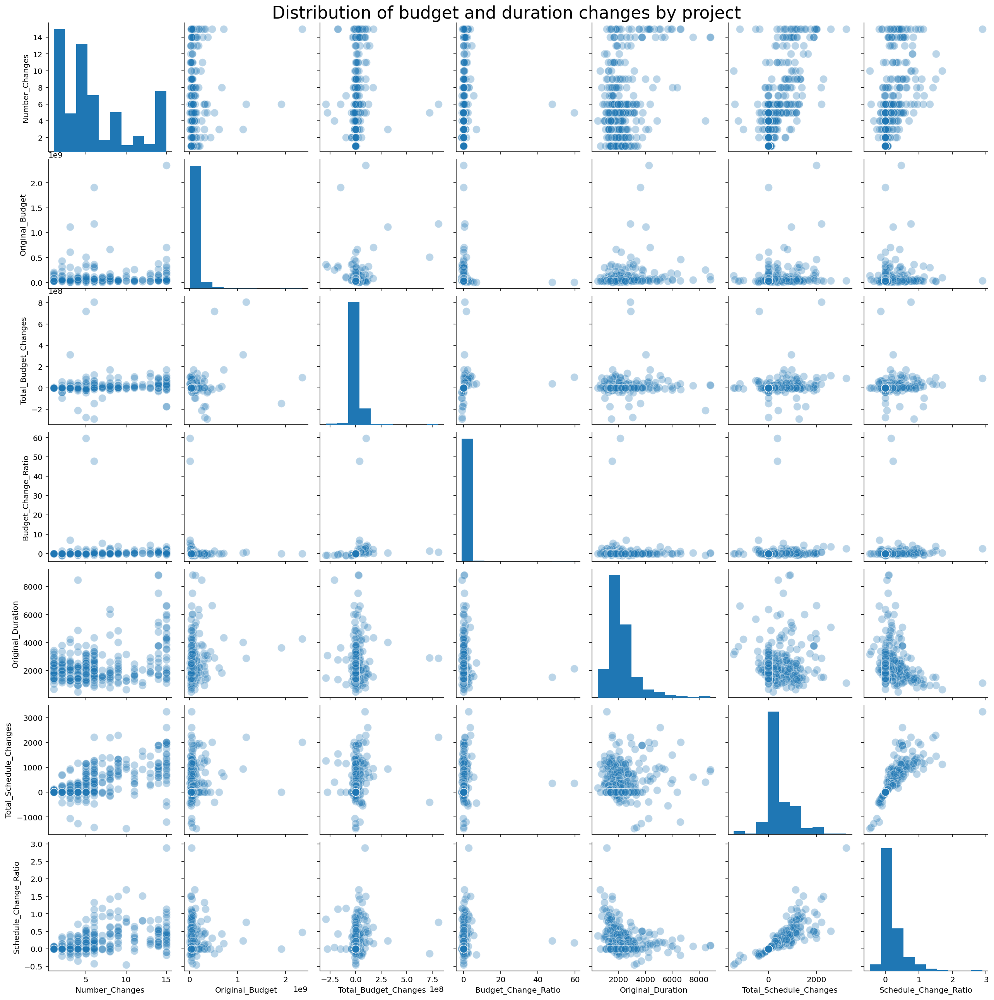

CPU times: user 6.77 s, sys: 125 ms, total: 6.89 s
Wall time: 6.69 s


In [48]:
%%time

# generate scatter matrix with each quantitative metric
scatter_cols = [
    'Number_Changes',
    'Original_Budget',
    'Total_Budget_Changes',
    'Budget_Change_Ratio',
    'Original_Duration',
    'Total_Schedule_Changes',
    'Schedule_Change_Ratio'
]

g = sns.pairplot(df_pid[scatter_cols], plot_kws={'alpha': 0.3, 's': 100})
g.fig.suptitle('Distribution of budget and duration changes by project', fontsize=22, y=1.015)
plt.show();

<br/>

**OBSERVATIONS:**

The above scatter matrix demonstrates, on a project-by-project basis, the correlation between quantitative features associated with each of the 355 unique projects that remain in the dataset. Of greatest interest here are relationships between the various "project change"-related measurements associated with each project. Of additional concern is the relative scale (in terms of budget and schedule duration) of the various projects measured.

In the subplots above, while there appears to be slight linear relationships between several features -- most notably the relationships between *total schedule change (in days)* and *schedule change ratio*, as well as *number of project changes* versus *schedule*-related metrics -- many of these relationships have fairly extreme outlying projects, which may obscure more nuanced relationships by compressing the majority of data points along either the $x$ or $y$ axes. The various relationships plotted against the *budget* and *budget change* features clearly exhibit this outlier behavior.

While the removal of these outliers and closer examination of non-outlying datapoints does warrant additional investigation, the remainder of this "change trend" analysis will instead focus on projects with extreme budget and schedule characteristics.

To do this, we will next look a little more closely at the distributions of *budget*- and *schedule*-related measures by project to identify some of the projects with these "extreme" measures.

<br/>

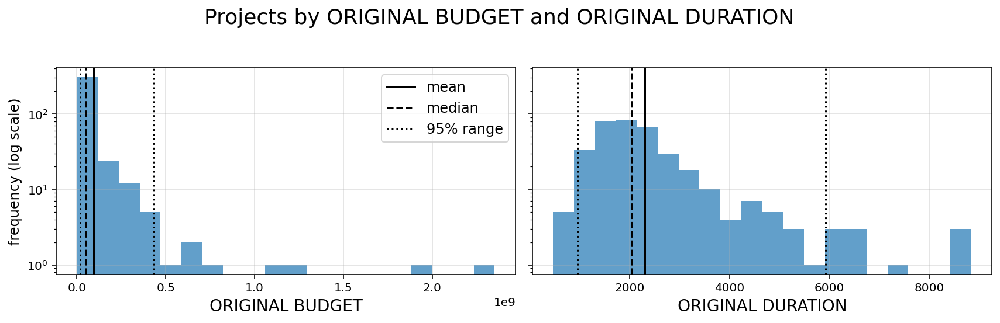

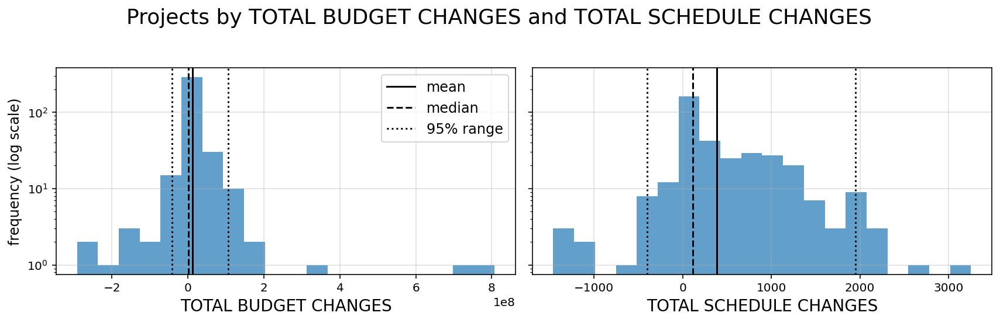

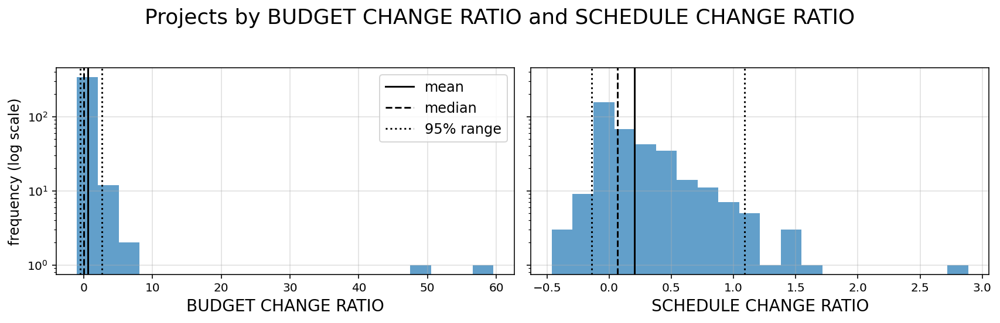

In [49]:
plot_hist_comps(df_pid, 'Original_Budget', 'Original_Duration', y_log=True)
plot_hist_comps(df_pid, 'Total_Budget_Changes', 'Total_Schedule_Changes', y_log=True)
plot_hist_comps(df_pid, 'Budget_Change_Ratio', 'Schedule_Change_Ratio', y_log=True)

<br/>

**OBSERVATIONS:**

As can be seen in the paired histogram plots above, most features exhibit distinct right-skewed distributions among projects. Most notably, among the "original" budget and duration as well as the "change ratios" for both budget and duration, clear outliers exist at extremely high values (these ratios are defined as the "total changes" divided by the "original" values for each project).

While a more in-depth statistical analysis will be needed to explore the aggregate change trends among all projects measured, for the purpose of this initial EDA, we will just visually inspect the time-series changes that have taken place among some of these more "extreme" projects below.

<br/>

### Investigate change trends by project for extreme changes or extreme original scope values

In [50]:
def identify_edge_pids(df, metric_col, n_pids=2,
                       change_threshold=5, change_col='Number_Changes'):
    """Identifies PIDs with minimum and maximum values for any given metric
    """
    loc_filter = df[change_col]>=change_threshold
    max_pids = list(
        df.loc[loc_filter].sort_values(by=metric_col, ascending=True)[-n_pids:]['PID']
    )
    min_pids = list(
        df.loc[loc_filter].sort_values(by=metric_col, ascending=True)[:n_pids]['PID']
    )
    
    return {'min': min_pids, 'max': max_pids}

In [51]:
metric_col_list = [
    'Original_Budget',
    'Original_Duration',
    'Budget_Change_Ratio',
    'Schedule_Change_Ratio',
]

change_threshold = 5

edge_pids_dict = {
    metric_col: identify_edge_pids(
        df_pid, metric_col, n_pids=2, change_threshold=change_threshold
    )
    for metric_col in metric_col_list
}

print(
    'Projects with {} or more change records, and the largest and '\
    'smallest metric values are as follows:\n'.format(change_threshold)
)

for key, value in edge_pids_dict.items():
    print('{}\n'.format(key))
    for edge, pid_list in value.items():
        print('{}:\t{}'.format(edge, pid_list))
    print()

Projects with 5 or more change records, and the largest and smallest metric values are as follows:

Original_Budget

min:	[603, 784]
max:	[555, 416]

Original_Duration

min:	[480, 507]
max:	[96, 112]

Budget_Change_Ratio

min:	[537, 594]
max:	[603, 784]

Schedule_Change_Ratio

min:	[482, 690]
max:	[480, 193]



### Time series plots for projects with extreme changes or extreme original scope values

### Largest *Budget Change* and *Schedule Change*  ratios

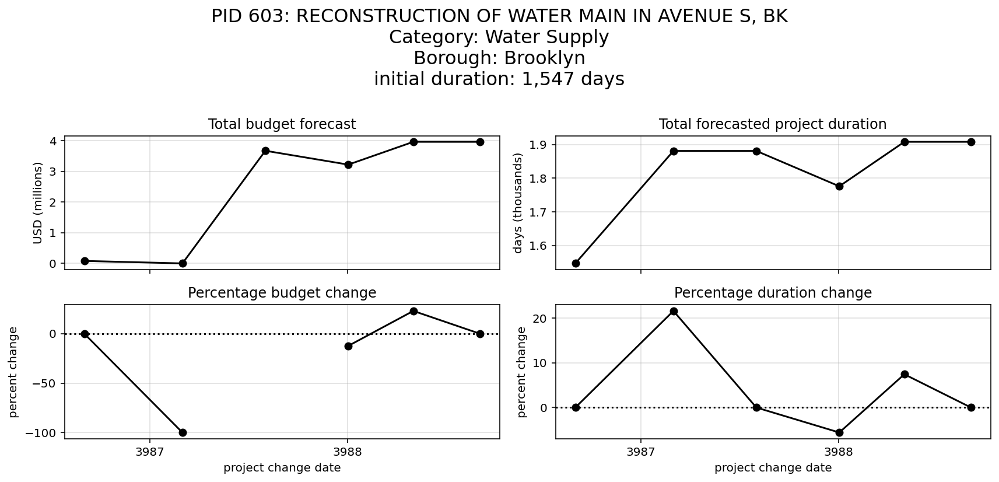

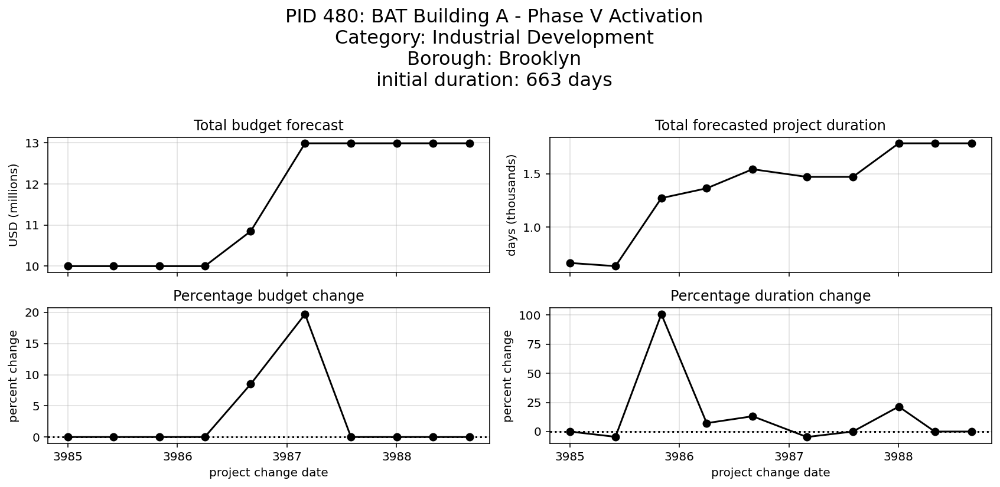

In [52]:
plot_change_trend(data, df_pid, 603)
plot_change_trend(data, df_pid, 480)

<br/>

The two projects plotted above represent:

1. **PID 603:** The **smallest** *Original Budget* and **largest** *Budget Change Ratio*


2. **PID 480:** The **shortest** *Original Scheduled Duration* and **largest** *Schedule Change Ratio*

<br/>

**OBSERVATIONS:**

In the case of both these projects, extremely large re-forecasts in budget and schedule were made during the life of the projects. Conversely, both started with extremely small forecasts relative to other projects in this dataset. In both these cases, we are led to question the validity of the original scopes for both projects. Either that, or perhaps significant additional scope was added to each project after the original design was completed.  

<br/>

### Largest *Original Budget*

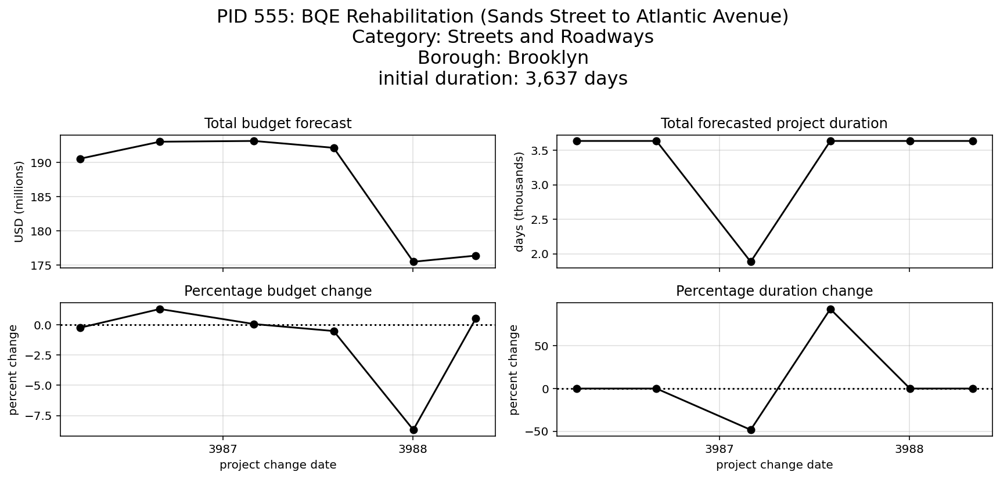

In [53]:
plot_change_trend(data, df_pid, 555)

<br/>

The project above represents:


3. **PID 555:** The **largest** *Original Budget*

<br/>

**OBSERVATIONS:**

It the above project change timeline, it is interesting to note the overall reduction in budget forecast over time, as well as the erratic short-term reduction in forecasted duration. Additional information on a project such as this would be of interest to understand the temporary reduction in hours by more that 1,500 days.

<br/>

### Longest *Original Scheduled Duration*

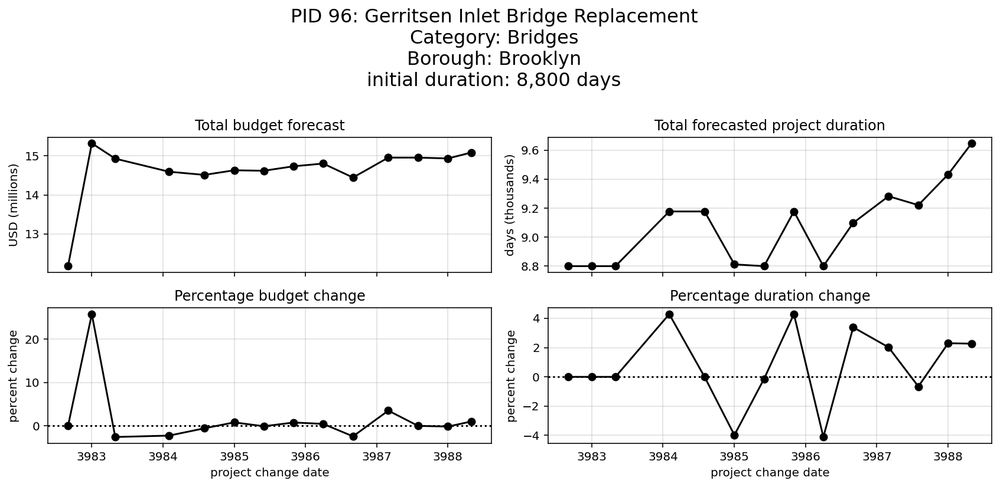

In [54]:
plot_change_trend(data, df_pid, 96)

<br/>

The project above represents:


4. **PID 96:** The **longest** *Original Scheduled Duration*

<br/>

**OBSERVATIONS:**

Althought this project began as the project with the longest original scheduled duration, at more than 8,800 days, it is intersting to note that this scope has still increased by an additional 1,800 days.

<br/>

### Smallest *Budget Change* and *Schedule Change* Ratios

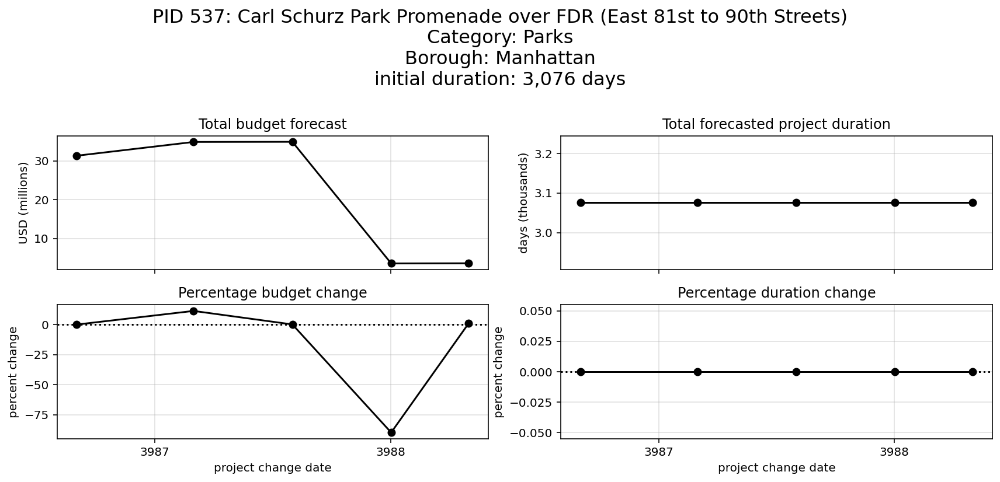

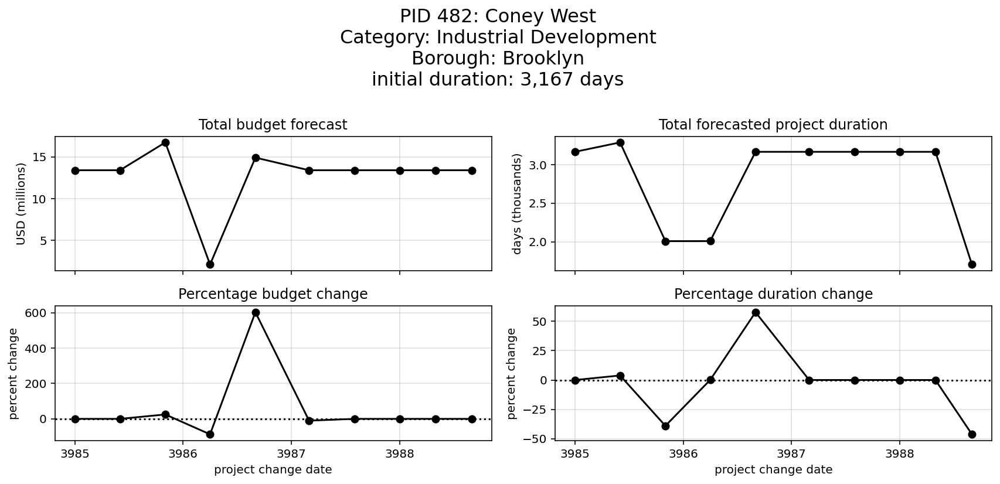

In [55]:
plot_change_trend(data, df_pid, 537)
plot_change_trend(data, df_pid, 482)

<br/>

The project above represents:

5. **PID 537:** The **smallest** *Budget Change Ratio*

6. **PID 482:** The **smallest** *Schedule Change Ratio*

<br/>

**OBSERVATIONS:**

Both of the above plots exhibit fairly extreme reductions in scope over the life of the project. PID 537 decreased in budget forecast from more than \\$30 million to less than \\$5 million with no corresponding reduction in scheduled duration. The second, PID 482, exhibited a reduction in scheduled duration from more than 3,000 days, to fewer than 2,000 days, but only temporarily exhibited a reduction in forecasted budget.

**CONCERNS:**

These two projects, as well as the others examined above, leads us to wonder the validity of some of the measures reported in this data, as well as the confounding factors that may also be influencing some of these changes in scope and forecast.

<br/>

<a name='budget'></a>
## Budget Values

<a href=#index>index</a>

### Stationary budget values (originally forecasted vs to date)

Metrics calculated:

- Absolute percentage error: |Forecast − Actual|/Actual
- Relative percentage error: (referred to as cost escalation in project estimation literature): |Forecast − Actual|/Forecast:
- Ratios: Forecast/Actual or Actual/Forecast Difference: Actual − Forecast
- Days delayed (only the positive differences) Absolute error: |Forecast − Actual| Squared error: (Forecast − Actual)2

In [56]:
df_pid = df_pid.eval('Budget_To_Date = Original_Budget + Total_Budget_Changes')\
            .eval('Budget_Abs_Per_Error = abs(Original_Budget - Budget_To_Date)/Budget_To_Date')\
            .eval('Budget_Rel_Per_Error = abs(Original_Budget - Budget_To_Date)/Original_Budget')\
            .eval('Mark_Metric = (Original_Budget/Budget_To_Date) - 1')\
            .eval('Budget_Ratios = Budget_To_Date/Original_Budget')
df_pid

,PID,Project_Name,Category,Borough,Managing_Agency,Client_Agency,Number_Changes,Original_Budget,Design_Start,Original_Schedule,...,Total_Schedule_Changes,Total_Budget_Changes,Original_Duration,Budget_Change_Ratio,Schedule_Change_Ratio,Budget_To_Date,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Mark_Metric,Budget_Ratios
0,3,26th Ward Waste Water Treatment Plant Prelimin...,Wastewater Treatment,Brooklyn,DEP,DEP,13,"184,896,360.00",2013-09-23,2020-01-13,...,270.00,"-4,318,643.37","2,303.00",-0.02,0.12,"180,577,716.63",0.02,0.02,0.02,0.98
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,Wastewater Treatment,Queens,DEP,DEP,15,"53,493,000.00",2013-05-01,2018-03-31,...,685.00,"15,305,457.00","1,795.00",0.29,0.38,"68,798,457.00",0.22,0.29,-0.22,1.29
2,18,Croton Falls Pumping Station Construction,Water Supply,Carmel,DEP,DEP,15,"66,616,435.00",2003-08-22,2017-05-31,...,"1,014.00","1,255,175.02","5,031.00",0.02,0.20,"67,871,610.02",0.02,0.02,-0.02,1.02
3,25,Gowanus Facilities Upgrade,Wastewater Treatment,Brooklyn,DEP,DEP,15,"198,134,067.00",2001-11-01,2014-08-05,...,"1,974.00","25,233,101.11","4,660.00",0.13,0.42,"223,367,168.11",0.11,0.13,-0.11,1.13
4,34,Jamaica Waste Water Treatment Plant Upgrades,Wastewater Treatment,Queens,DEP,DEP,15,"463,790,739.00",1996-05-01,2014-07-01,...,"2,009.00","-14,632,471.11","6,635.00",-0.03,0.30,"449,158,267.89",0.03,0.03,0.03,0.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,1010,PRIOR NOTICE SIDEWALKS - BROOKLYN,Streets and Roadways,not_specified,DDC,DOT,1,"29,427,000.00",2015-08-06,2020-05-13,...,0.00,0.00,"1,742.00",0.00,0.00,"29,427,000.00",0.00,0.00,0.00,1.00
359,1011,"RECONSTRUCTION OF ROSEDALE AREA, PHASE 2",Streets and Roadways,not_specified,DDC,DOT,1,"39,360,000.00",2018-06-07,2024-08-14,...,0.00,0.00,"2,260.00",0.00,0.00,"39,360,000.00",0.00,0.00,0.00,1.00
360,1012,"RECONSTRUCTION OF FRONT STREET, MANHATTAN",Streets and Roadways,not_specified,DDC,DOT,1,"27,356,000.00",2015-07-31,2022-06-16,...,0.00,0.00,"2,512.00",0.00,0.00,"27,356,000.00",0.00,0.00,0.00,1.00
361,1013,"GRAND CONCOURSE, PHASE 5",Streets and Roadways,not_specified,DDC,DOT,1,"78,921,000.00",2019-09-16,2025-09-13,...,0.00,0.00,"2,189.00",0.00,0.00,"78,921,000.00",0.00,0.00,0.00,1.00


In [57]:
df_pid_melted = df_pid.melt(id_vars=set(df_pid.columns) - set(["Budget_Abs_Per_Error", "Budget_Rel_Per_Error", 'Budget_Ratios', "Mark_Metric"]), value_vars=["Budget_Abs_Per_Error", "Budget_Rel_Per_Error", 'Budget_Ratios', "Mark_Metric"], var_name="metric", value_name="metric_value")
df_pid_melted


,Client_Agency,Original_Schedule,Original_Budget,Schedule_Change_Ratio,Project_Name,Total_Budget_Changes,Borough,Budget_To_Date,Category,Forecast_Completion,Budget_Change_Ratio,PID,Total_Schedule_Changes,Original_Duration,Design_Start,Number_Changes,Managing_Agency,metric,metric_value
0,DEP,2020-01-13,"184,896,360.00",0.12,26th Ward Waste Water Treatment Plant Prelimin...,"-4,318,643.37",Brooklyn,"180,577,716.63",Wastewater Treatment,2020-10-09,-0.02,3,270.00,"2,303.00",2013-09-23,13,DEP,Budget_Abs_Per_Error,0.02
1,DEP,2018-03-31,"53,493,000.00",0.38,Bowery Bay Waste Water Treatment Plant Main Se...,"15,305,457.00",Queens,"68,798,457.00",Wastewater Treatment,2020-02-14,0.29,7,685.00,"1,795.00",2013-05-01,15,DEP,Budget_Abs_Per_Error,0.22
2,DEP,2017-05-31,"66,616,435.00",0.20,Croton Falls Pumping Station Construction,"1,255,175.02",Carmel,"67,871,610.02",Water Supply,2020-03-10,0.02,18,"1,014.00","5,031.00",2003-08-22,15,DEP,Budget_Abs_Per_Error,0.02
3,DEP,2014-08-05,"198,134,067.00",0.42,Gowanus Facilities Upgrade,"25,233,101.11",Brooklyn,"223,367,168.11",Wastewater Treatment,2019-12-31,0.13,25,"1,974.00","4,660.00",2001-11-01,15,DEP,Budget_Abs_Per_Error,0.11
4,DEP,2014-07-01,"463,790,739.00",0.30,Jamaica Waste Water Treatment Plant Upgrades,"-14,632,471.11",Queens,"449,158,267.89",Wastewater Treatment,2019-12-31,-0.03,34,"2,009.00","6,635.00",1996-05-01,15,DEP,Budget_Abs_Per_Error,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,DOT,2020-05-13,"29,427,000.00",0.00,PRIOR NOTICE SIDEWALKS - BROOKLYN,0.00,not_specified,"29,427,000.00",Streets and Roadways,2020-05-13,0.00,1010,0.00,"1,742.00",2015-08-06,1,DDC,Mark_Metric,0.00
1416,DOT,2024-08-14,"39,360,000.00",0.00,"RECONSTRUCTION OF ROSEDALE AREA, PHASE 2",0.00,not_specified,"39,360,000.00",Streets and Roadways,2024-08-14,0.00,1011,0.00,"2,260.00",2018-06-07,1,DDC,Mark_Metric,0.00
1417,DOT,2022-06-16,"27,356,000.00",0.00,"RECONSTRUCTION OF FRONT STREET, MANHATTAN",0.00,not_specified,"27,356,000.00",Streets and Roadways,2022-06-16,0.00,1012,0.00,"2,512.00",2015-07-31,1,DDC,Mark_Metric,0.00
1418,DOT,2025-09-13,"78,921,000.00",0.00,"GRAND CONCOURSE, PHASE 5",0.00,not_specified,"78,921,000.00",Streets and Roadways,2025-09-13,0.00,1013,0.00,"2,189.00",2019-09-16,1,DDC,Mark_Metric,0.00


#### Comparing 3 budget metrics

In [58]:
px.histogram(df_pid_melted,x="metric_value", facet_col="metric", color="Category", barmode="overlay" )

### Budget Changes Time Series

In [59]:
fig = px.line(data.sort_values(['Date_Reported_As_Of', "PID"]), x='Date_Reported_As_Of', y="Latest_Budget_Changes", color= "Category", line_dash="PID", hover_name="PID", height=1000)
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig

**OBSERVATION**

There's a few projects that have enormous changes and skew the plot, while others are more clustered

In [60]:
fig = px.line(data.sort_values(['Date_Reported_As_Of', "PID"]), x='Date_Reported_As_Of', y="Latest_Budget_Changes", facet_col = "Borough", color= "Category", hover_name="PID", line_group="PID", facet_col_wrap=5, height= 2000)
fig

**OBSERVATION:**
    
- Alot of the projects with big changes do not have `Borough` specified, so it's unlikely we could use it as predictor for budget/schedule changes
- Some Borough have only one Category of projects (Manhattan only has `Bridges`)
- We also looked at budget changes conditional on Managing Agency and Client Agency, but didn't include them to preserve clarity

<a name='summary'></a>
## Summary & Findings

<a href=#index>index</a>

- Poor data quality. The trend analyses for a handful of projects led us to wonder if the validity of some of the measures reported in this data, as well as the confounding factors that may also be influencing some of these changes in scope and forecast.

- Data is inconsistent in quality. Human-entered data will always have inconsistencies. We will need to work around or with that.

- Any model will need more data. We will need to source more project data from other regions and types of projects to increase the variety

- Lots of missing data. Any analyses would have to dive into the various biases that removing the missing data entails

- To feed a model, some data engineering will be necessary. The types of dat that need to be created are not yet understood.

- Any efforts to normalize data will need to consider normalization within the project as well as within the entire dataset.



## Key Questions

**Given everything you have learned, if you faced this data set in the wild, how would you proceed?**

- Need to do some investigations on some of the projects and their budget/schedule deviations. Simply removing the projects with seemingly erroneous or inconsistent data could lead to a biased dataset.

- Find secondary sources of data on the projects/agencies and management practices, how data is collected and incentive systems.

- Collect information on how the project management methodology in the specific reporting agencies.


**What are the important measures?**

- Actual vs initally planned project costs and duration.


**What are the right questions to ask, and how can the data answer them?**

- Are there any quantitative indicators at the beginning of the project that would help us predict the risk of cost and time overrun?

- Are there indicators during the life cycle of a project that would help us predict the risk of cost and time overrun?


**The data we have right now is insufficient to answer these questions. All of the projects we currently have data for have not finished.**

Additional data that we need would be:

- Information about finished projects.
- Text: Potential unstructured text sources like project plans, project review, project contracts.
- Key players at the management level, clients, organizations, vendors.
- Labor and materials percentages of total cost.
- Engineering complexity.
- Sources/Agencies of funding.
- Geographical locations of the delivered projects, geographical characteristics.


<a name='save'></a>

## Save dataframes to .csv

Save resulting dataframes to .csv for further analysis

<a href=#index>index</a>

### Drop PIDs with missing critical data from dataframe

In [61]:
drop_pid_list = [pid[0] for pid in drop_pids]

data = data.copy().loc[~data['PID'].isin(drop_pid_list)]

### Map 'Design_Start' date to projects where several records are missing the date 

In [62]:
design_start_dict = {
    key: value for key, value in zip(df_pid['PID'], df_pid['Design_Start'].values)
}

data['Design_Start'] = data['PID'].copy().map(design_start_dict)

### Create unique ID for each remaining PID change in chronological order by PID

In [63]:
#still missing values in budget forecast and forecast completion columns
data.info()
len_data = len(data)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2095 entries, 0 to 2258
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date_Reported_As_Of      2095 non-null   datetime64[ns]
 1   PID                      2095 non-null   int64         
 2   Project_Name             2095 non-null   object        
 3   Description              2095 non-null   object        
 4   Category                 2095 non-null   object        
 5   Borough                  2095 non-null   object        
 6   Managing_Agency          2095 non-null   object        
 7   Client_Agency            2095 non-null   object        
 8   Current_Phase            2095 non-null   object        
 9   Design_Start             2095 non-null   datetime64[ns]
 10  Original_Budget          2095 non-null   float64       
 11  Budget_Forecast          2094 non-null   float64       
 12  Latest_Budget_Changes    2095 non-

In [64]:
# generate ordered list of unique ids for each change to make further
# processing of data easier
pid_list = list(set(data['PID']))

for i, pid in enumerate(pid_list):
    if i == 0:
        data_temp = data.copy().loc[data['PID']==pid].sort_values(by='Date_Reported_As_Of')
        data_temp = data_temp.reset_index(drop=True)
        data_temp['PID_Index'] = data_temp.index
        data_temp['Record_ID'] = data_temp['PID'].astype(str) + '-' + data_temp['PID_Index'].astype(str)
    else:
        pid_subset = data.copy().loc[data['PID']==pid].sort_values(by='Date_Reported_As_Of')
        pid_subset = pid_subset.reset_index(drop=True)
        pid_subset['PID_Index'] = pid_subset.index
        pid_subset['Record_ID'] = pid_subset['PID'].astype(str) + '-' + pid_subset['PID_Index'].astype(str)
        data_temp = pd.concat([data_temp.copy(), pid_subset.copy()])

assert len(data_temp)==len_data

# replace dataframe with new concatenated PID frames, set index as record ID
data = data_temp.set_index('Record_ID')

### Fill missing Budget Forecast value

In [65]:
def find_missing_value_records(df, column):
    """
    """
    records = data.loc[
        data[column].isnull()
    ].index
    
    return records

def make_missing_records_dict(df, column):
    records = find_missing_value_records(df, column)
    records_dict = {
        value[0]: value[1]
        for value in [
            list(np.array(record.split('-')).astype(int))
            for record in records
        ]
    }
    return records_dict

In [66]:
# fill in missing 'Forecast_Completion' records
records_dict = make_missing_records_dict(data, column='Forecast_Completion')
print(
    'Project changes missing Forecast_Completion values:\n\n'\
    '{}\n'.format(records_dict)
)

for key, value in records_dict.items():
    if value==0:
        record = str(key) + '-' + str(value)
        orig_date = data.loc[record, 'Original_Schedule']
        date_offset = pd.DateOffset(days=data.loc[record, 'Latest_Schedule_Changes'])
        new_date = orig_date + date_offset
        data.loc[record, 'Forecast_Completion'] = new_date
    else:
        record = str(key) + '-' + str(value)
        prev_record = str(key) + '-' + str(value-1)
        orig_date = data.loc[prev_record, 'Forecast_Completion']
        date_offset = pd.DateOffset(days=data.loc[record, 'Latest_Schedule_Changes'])
        new_date = orig_date + date_offset
        data.loc[record, 'Forecast_Completion'] = new_date
        
records_dict = make_missing_records_dict(data, column='Forecast_Completion')
print(
    'Forecast_Completion values still missing after replacement:\n\n'\
    '{}'.format(records_dict)
)


Project changes missing Forecast_Completion values:

{360: 12, 542: 6, 569: 0, 586: 5, 789: 0, 790: 0}

Forecast_Completion values still missing after replacement:

{}


In [67]:
# fill in missing 'Budget_Forecast' records
records_dict = make_missing_records_dict(data, column='Budget_Forecast')

print(
    'Project changes missing Budget_Forecast values:\n\n'\
    '{}\n'.format(records_dict)
)

for key, value in records_dict.items():
    if value==0:
        record = str(key) + '-' + str(value)
        orig_bdgt = data.loc[record, 'Original_Budget']
        bdgt_offset = data.loc[record, 'Latest_Budget_Changes']
        new_bdgt = orig_bdgt + bdgt_offset
        data.loc[record, 'Budget_Forecast'] = new_bdgt
    else:
        record = str(key) + '-' + str(value)
        prev_record = str(key) + '-' + str(value-1)
        orig_bdgt = data.loc[prev_record, 'Budget_Forecast']
        bdgt_offset = data.loc[record, 'Latest_Budget_Changes']
        new_bdgt = orig_bdgt + bdgt_offset
        data.loc[record, 'Budget_Forecast'] = new_bdgt
        
records_dict = make_missing_records_dict(data, column='Budget_Forecast')

print(
    'Budget_Forecast values still missing after replacement:\n\n'\
    '{}'.format(records_dict)
)


Project changes missing Budget_Forecast values:

{569: 0}

Budget_Forecast values still missing after replacement:

{}


In [68]:
# reset index to make Record_ID a column instead of index
data = data.reset_index()

In [69]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2095 entries, 0 to 2094
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Record_ID                2095 non-null   object        
 1   Date_Reported_As_Of      2095 non-null   datetime64[ns]
 2   PID                      2095 non-null   int64         
 3   Project_Name             2095 non-null   object        
 4   Description              2095 non-null   object        
 5   Category                 2095 non-null   object        
 6   Borough                  2095 non-null   object        
 7   Managing_Agency          2095 non-null   object        
 8   Client_Agency            2095 non-null   object        
 9   Current_Phase            2095 non-null   object        
 10  Design_Start             2095 non-null   datetime64[ns]
 11  Original_Budget          2095 non-null   float64       
 12  Budget_Forecast          2095 non-

### Add 'Current_Project_Year' to each change record

In [70]:
# years represented as float
data['Change_Years'] = (
    data['Date_Reported_As_Of'] - data['Design_Start']
).dt.days / 365.2425

# year and represented as integer, starting at 1 for during 1st year
data['Change_Year'] = np.ceil(data['Change_Years']).astype(int)

# years represented as float
data['Current_Project_Years'] = (
    data['Date_Reported_As_Of'].max() - data['Design_Start']
).dt.days / 365.2425

# year and represented as integer, starting at 1 for during 1st year
data['Current_Project_Year'] = np.ceil(data['Current_Project_Years']).astype(int)

### Add 'Project_Year' to each PID record to indicate year of project at max 'Date_Reported_As_Of' date

In [71]:
df_pid['Project_Years'] = (
    data['Date_Reported_As_Of'].max() - df_pid['Design_Start']
).dt.days / 365.2425

df_pid['Project_Year'] = np.ceil(df_pid['Project_Years']).astype(int)

### Report on 'Project_Year' metrics for change records and PIDs

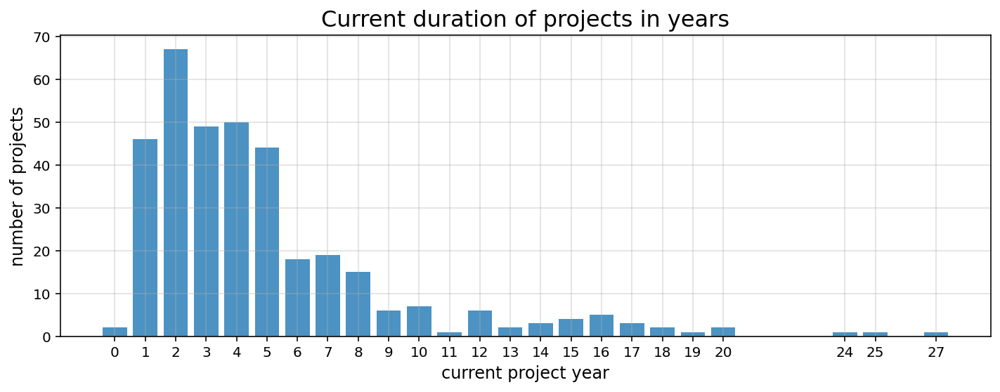

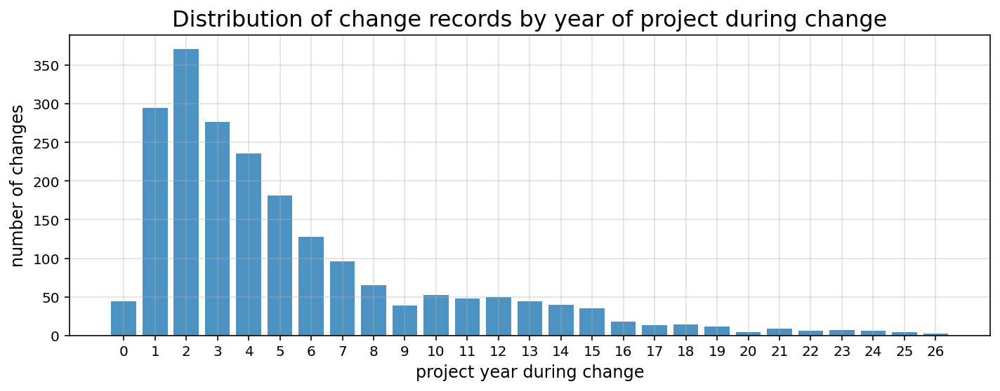

In [72]:
project_yrs = df_pid['Project_Year'].value_counts().sort_index()

plt.figure(figsize=(10, 4))
plt.bar(project_yrs.index, project_yrs.values, alpha=0.8)
plt.title(
    'Current duration of projects in years',
    fontsize=16
)
plt.grid(':', alpha=0.4)
plt.xticks(project_yrs.index)
plt.xlabel('current project year', fontsize=12)
plt.ylabel('number of projects', fontsize=12)
plt.tight_layout()
plt.show();

change_yr = data['Change_Year'].value_counts().sort_index()

plt.figure(figsize=(10,4))
plt.bar(change_yr.index, change_yr.values, alpha=0.8)
plt.title(
    'Distribution of change records by year of project during change',
    fontsize=16
)
plt.grid(':', alpha=0.4)
plt.xticks(change_yr.index)
plt.xlabel('project year during change', fontsize=12)
plt.ylabel('number of changes', fontsize=12)
plt.tight_layout()
plt.show();


In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2095 entries, 0 to 2094
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Record_ID                2095 non-null   object        
 1   Date_Reported_As_Of      2095 non-null   datetime64[ns]
 2   PID                      2095 non-null   int64         
 3   Project_Name             2095 non-null   object        
 4   Description              2095 non-null   object        
 5   Category                 2095 non-null   object        
 6   Borough                  2095 non-null   object        
 7   Managing_Agency          2095 non-null   object        
 8   Client_Agency            2095 non-null   object        
 9   Current_Phase            2095 non-null   object        
 10  Design_Start             2095 non-null   datetime64[ns]
 11  Original_Budget          2095 non-null   float64       
 12  Budget_Forecast          2095 non-

In [74]:
print(
    'The resulting dataframes will be saved to .csv at the following path locations:\n'
)
for save_path in [save_path_clean, save_path_pid, save_path_pid_melted]:
    print(save_path)

The resulting dataframes will be saved to .csv at the following path locations:

../data/interim/Capital_Projects_clean.csv
../data/interim/Capital_Projects_pid.csv
../data/interim/Capital_Projects_pid_melted.csv


In [75]:
data.to_csv(save_path_clean, index=False)
df_pid.to_csv(save_path_pid, index=False)
df_pid_melted.to_csv(save_path_pid_melted, index=False)